In [1]:
import torch
from diffusers import FluxPipeline

/users/gmongaras/miniconda3/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-12-16 08:55:38.472739: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-16 08:55:39.235493: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT



===================================BUG REPORT===================================
Welcome to bitsandbytes. For bug reports, please run

python -m bitsandbytes

 and submit this information together with your error trace to: https://github.com/TimDettmers/bitsandbytes/issues
bin /users/gmongaras/miniconda3/lib/python3.10/site-packages/bitsandbytes/libbitsandbytes_cuda118.so
CUDA SETUP: CUDA runtime path found: /users/gmongaras/cuda-11.8/lib64/libcudart.so
CUDA SETUP: Highest compute capability among GPUs detected: 8.0
CUDA SETUP: Detected CUDA version 118
CUDA SETUP: Loading binary /users/gmongaras/miniconda3/lib/python3.10/site-packages/bitsandbytes/libbitsandbytes_cuda118.so...


/users/gmongaras/miniconda3/lib/python3.10/site-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: /hpc/mp/apps/conda did not contain ['libcudart.so', 'libcudart.so.11.0', 'libcudart.so.12.0'] as expected! Searching further paths...
  warn(msg)


In [2]:
with open("../.env", "r") as f:
    token = f.read().strip()
pipe = FluxPipeline.from_pretrained("black-forest-labs/FLUX.1-dev", torch_dtype=torch.bfloat16, cache_dir=".././cache", token=token)
pipe = pipe.to("cuda")

Loading pipeline components...: 100%|██████████| 7/7 [00:02<00:00,  3.34it/s]


In [3]:
# Reimport blocks
import importlib
import Flux_Blocks as Flux_Blocks
importlib.reload(Flux_Blocks)
FluxTransformerBlock = Flux_Blocks.FluxTransformerBlock
FluxSingleTransformerBlock = Flux_Blocks.FluxSingleTransformerBlock

In [4]:
# Load config
config = pipe.transformer.config

In [5]:
# Replace attention in stable diffusion with the imported one
beg = 0
end = 19
for i, layer in enumerate(pipe.transformer.transformer_blocks):
    if i >= beg and i < end:
        # Get state dict of the current layer
        state_dict = layer.state_dict().copy()
        # Old layer
        old_layer = layer
        # Add the new layer
        pipe.transformer.transformer_blocks[i] = FluxTransformerBlock(dim=config.num_attention_heads*config.attention_head_dim, num_attention_heads=config.num_attention_heads, attention_head_dim=config.attention_head_dim).to("cuda").to(torch.bfloat16)
        # Load the state dict
        pipe.transformer.transformer_blocks[i].load_state_dict(state_dict)
        # Delete the old layer
        del old_layer, state_dict

In [6]:
beg = 0
end = 38
for i, layer in enumerate(pipe.transformer.single_transformer_blocks):
    if i >= beg and i < end:
        # Get state dict of the current layer
        state_dict = layer.state_dict().copy()
        # Old layer
        old_layer = layer
        # Add the new layer
        pipe.transformer.single_transformer_blocks[i] = FluxSingleTransformerBlock(dim=config.num_attention_heads*config.attention_head_dim, num_attention_heads=config.num_attention_heads, attention_head_dim=config.attention_head_dim).to("cuda").to(torch.bfloat16)
        # Load the state dict
        pipe.transformer.single_transformer_blocks[i].load_state_dict(state_dict)
        # Delete the old layer
        del old_layer, state_dict

In [6]:
# Reimport attention processor
import CustomProcessor as CustomProcessor
import importlib
importlib.reload(CustomProcessor)
CustomProcessor = CustomProcessor.CustomProcessor

# Replace attention in stable diffusion with the imported one
num_skip = 0
for i, layer in enumerate(pipe.transformer.transformer_blocks):
    if i >= num_skip:
        layer.attn.set_processor(CustomProcessor())
        layer.attn.processor.idx = i


# Reset all distances
for layer in pipe.transformer.transformer_blocks:
    layer.attn.processor.query_dist = []
    layer.attn.processor.key_dist = []
    layer.attn.processor.value_dist = []

    layer.attn.processor.query_img_dist = []
    layer.attn.processor.key_img_dist = []
    layer.attn.processor.value_img_dist = []

    layer.attn.processor.query_text_dist = []
    layer.attn.processor.key_text_dist = []
    layer.attn.processor.value_text_dist = []

In [7]:
# Disable the attention processors
for layer in pipe.transformer.transformer_blocks:
    layer.attn.processor.merge = True

In [95]:
len(pipe.transformer.transformer_blocks)

19

In [190]:
transformer_off = False
transformer_single_off = False

# Disable merging in the blocks
for i, layer in enumerate(pipe.transformer.transformer_blocks):
    if transformer_off:
        layer.merge_attn = False
    else:
        if i < 20:
            layer.merge_attn = True
        else:
            layer.merge_attn = False
    layer.merge_ff = False
    layer.merge_per = 0.5
    # layer.merge_method = "BipartiteSoftMatching"
    layer.merge_method = "Random"
    if hasattr(layer, "hidden_states_merge"):
        del layer.hidden_states_merge
    if hasattr(layer, "hidden_states_merge_ff"):
        del layer.hidden_states_merge_ff

for i, layer in enumerate(pipe.transformer.single_transformer_blocks):
    if transformer_single_off:
        layer.merge_attn = False
    else:
        if i < 40:
            layer.merge_attn = True
        else:
            layer.merge_attn = False
    layer.merge_ff = False
    layer.merge_per = 0.5
    # layer.merge_method = "BipartiteSoftMatching"
    layer.merge_method = "Random"
    if hasattr(layer, "hidden_states_merge"):
        del layer.hidden_states_merge
    if hasattr(layer, "hidden_states_merge_ff"):
        del layer.hidden_states_merge_ff

In [191]:
pipe.transformer.transformer_blocks[-1].merge_attn

True

In [192]:
len(pipe.transformer.single_transformer_blocks)

38

In [193]:
# Clear cached cuda memory
torch.cuda.empty_cache()

In [194]:
# How do different strategies affect different layers or merging?
# Does bipartite matching have higher distance for later layers?
# Can we compute the score in the network before bipartite matching? Can this be reused between layers? Can a transformation of the intermediate layers be resused?


# Observations:
# 1. Bipartite doesn't actually do better than random for merging in latter layers and is slower since
#    you cannot cache the computation
# 2. Random merging along different axes does better than just one

  0%|          | 0/30 [00:00<?, ?it/s]

100%|██████████| 30/30 [00:13<00:00,  2.31it/s]


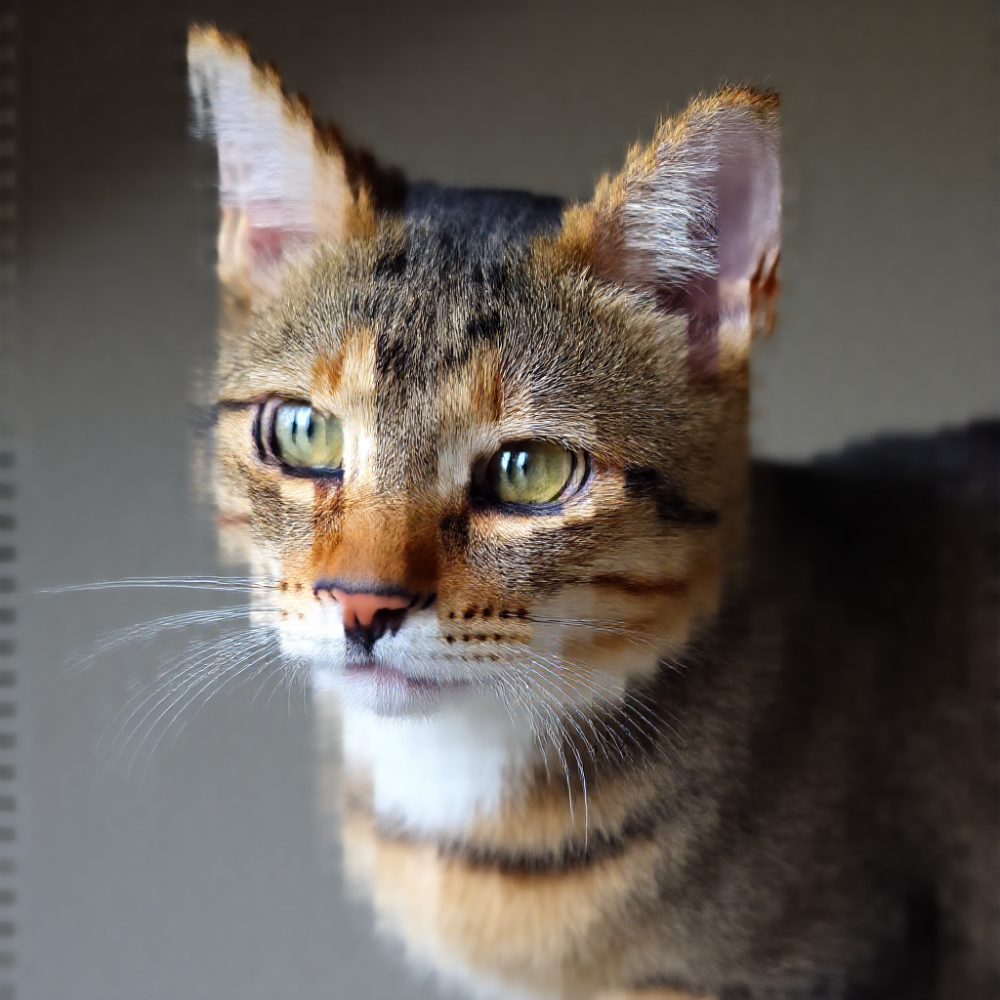

In [195]:
from torch.profiler import profile, record_function, ProfilerActivity

generator = torch.Generator(device="cuda").manual_seed(0)
prompt = "A cat"

image = pipe(
    prompt,
    height=1024,
    width=1024,
    guidance_scale=7.5,
    num_inference_steps=30,
    max_sequence_length=512, # For prompt
    generator=generator
).images[0]

image

In [38]:
pipe_ = torch.compile(pipe, mode="reduce-overhead")

skipping cudagraphs due to skipping cudagraphs due to cpu device (arg0_1). Found from : 
   File "/users/gmongaras/miniconda3/lib/python3.10/site-packages/diffusers/pipelines/flux/pipeline_flux.py", line 276, in torch_dynamo_resume_in__get_clip_prompt_embeds_at_269
    prompt_embeds = self.text_encoder(text_input_ids.to(device), output_hidden_states=False)

W1209 08:09:06.551000 4124953 site-packages/torch/_dynamo/convert_frame.py:844] [6/8] torch._dynamo hit config.cache_size_limit (8)
W1209 08:09:06.551000 4124953 site-packages/torch/_dynamo/convert_frame.py:844] [6/8]    function: 'as_tensor' (/users/gmongaras/miniconda3/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:736)
W1209 08:09:06.551000 4124953 site-packages/torch/_dynamo/convert_frame.py:844] [6/8]    last reason: 6/0: len(L['value'][0]) == 77                                    
W1209 08:09:06.551000 4124953 site-packages/torch/_dynamo/convert_frame.py:844] [6/8] To log all recompilation reasons, use TO

-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                                   Name    Self CPU %      Self CPU   CPU total %     CPU total  CPU time avg     Self CUDA   Self CUDA %    CUDA total  CUDA time avg    # of Calls  
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
ampere_bf16_s16816gemm_bf16_128x256_ldg8_relu_f2f_st...         0.00%       0.000us         0.00%       0.000us       0.000us        3.524s        25.97%        3.524s     608.696us          5790  
ampere_bf16_s16816gemm_bf16_256x128_ldg8_relu_f2f_st...         0.00%       0.000us         0.00%       0.000us       0.000us        2.988s        22.02%        2.988s     664.071us          4500  
void pyto

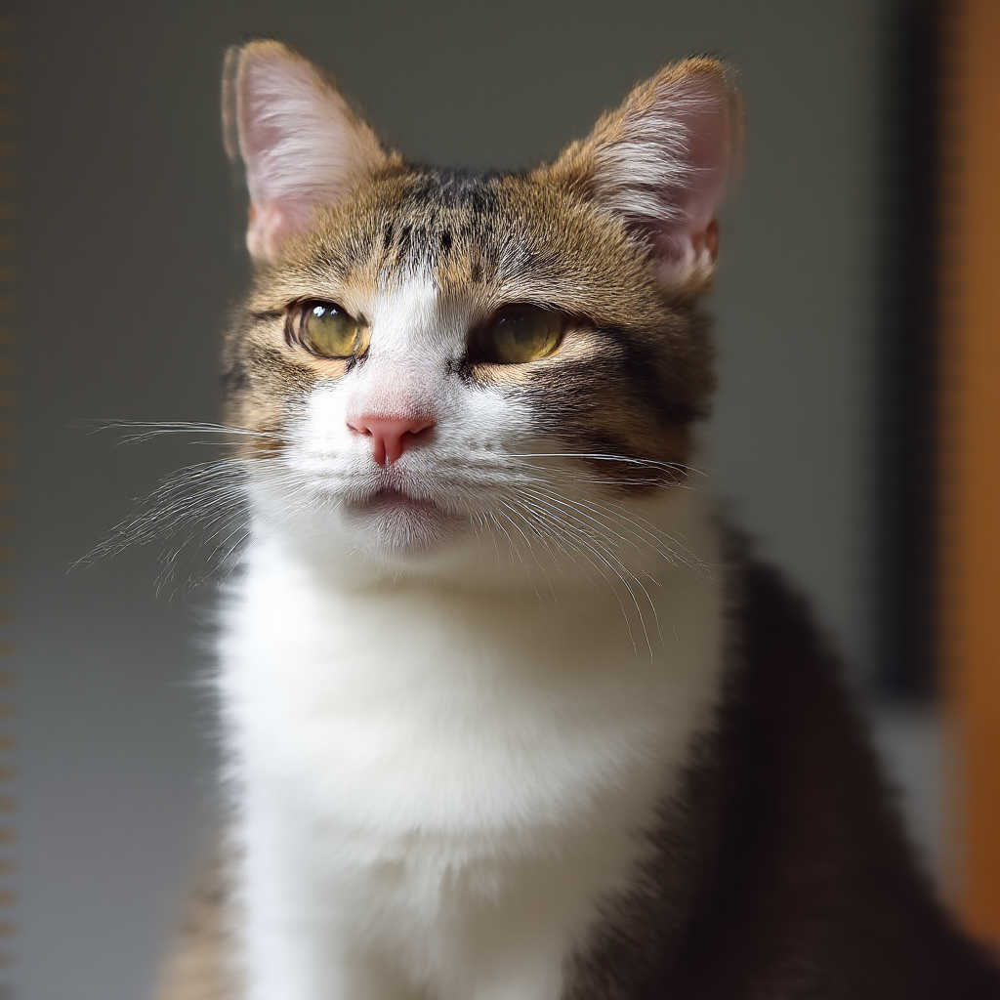

In [39]:
from torch.profiler import profile, record_function, ProfilerActivity

generator = torch.Generator(device="cuda").manual_seed(0)
prompt = "A cat"

with profile(activities=[ProfilerActivity.CUDA], record_shapes=True, with_stack=True) as prof:
    with record_function("model_inference"):
        with torch.inference_mode():
            image = pipe_(
                prompt,
                height=1024,
                width=1024,
                guidance_scale=7.5,
                num_inference_steps=30,
                max_sequence_length=512, # For prompt
                generator=generator
            ).images[0]

print(prof.key_averages().table(sort_by="self_cuda_time_total"))
image

  0%|          | 0/30 [00:00<?, ?it/s]

100%|██████████| 30/30 [00:10<00:00,  2.92it/s]


-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                                   Name    Self CPU %      Self CPU   CPU total %     CPU total  CPU time avg     Self CUDA   Self CUDA %    CUDA total  CUDA time avg    # of Calls  
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
ampere_bf16_s16816gemm_bf16_128x256_ldg8_f2f_stages_...         0.00%       0.000us         0.00%       0.000us       0.000us        3.723s        35.22%        3.723s     593.812us          6270  
ampere_bf16_s16816gemm_bf16_256x128_ldg8_f2f_stages_...         0.00%       0.000us         0.00%       0.000us       0.000us        2.666s        25.22%        2.666s       1.089ms          2448  
void pyto

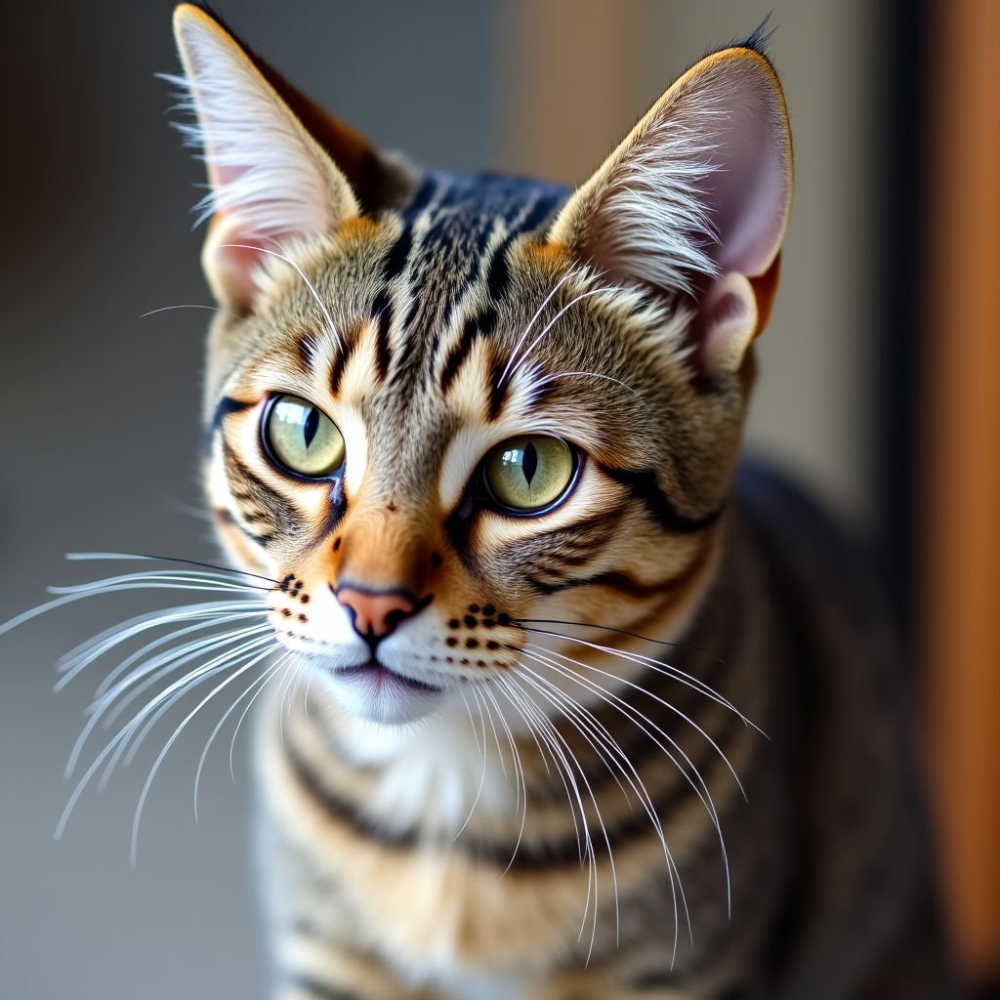

In [31]:
from torch.profiler import profile, record_function, ProfilerActivity

generator = torch.Generator(device="cuda").manual_seed(0)
prompt = "A cat"

with profile(activities=[ProfilerActivity.CUDA], record_shapes=True, with_stack=True) as prof:
    with record_function("model_inference"):
        with torch.inference_mode():
            image = pipe_(
                prompt,
                height=1024,
                width=1024,
                guidance_scale=7.5,
                num_inference_steps=30,
                max_sequence_length=512, # For prompt
                generator=generator
            ).images[0]

print(prof.key_averages().table(sort_by="self_cuda_time_total"))
image

In [29]:
from torch.profiler import profile, record_function, ProfilerActivity

generator = torch.Generator(device="cuda").manual_seed(0)
prompt = "A cat"

with profile(activities=[ProfilerActivity.CUDA], record_shapes=True, with_stack=True) as prof:
    with record_function("model_inference"):
        image = pipe(
            prompt,
            height=1024,
            width=1024,
            guidance_scale=7.5,
            num_inference_steps=30,
            max_sequence_length=512, # For prompt
            generator=generator
        ).images[0]

print(prof.key_averages().table(sort_by="self_cuda_time_total"))

100%|██████████| 30/30 [00:13<00:00,  2.15it/s]
Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x1555520f0f40>>
Traceback (most recent call last):
  File "/users/gmongaras/miniconda3/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                                   Name    Self CPU %      Self CPU   CPU total %     CPU total  CPU time avg     Self CUDA   Self CUDA %    CUDA total  CUDA time avg    # of Calls  
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
ampere_bf16_s16816gemm_bf16_128x256_ldg8_relu_f2f_st...         0.00%       0.000us         0.00%       0.000us       0.000us        4.083s        28.72%        4.083s     550.995us          7410  
ampere_bf16_s16816gemm_bf16_256x128_ldg8_relu_f2f_st...         0.00%       0.000us         0.00%       0.000us       0.000us        2.615s        18.40%        2.615s     908.027us          2880  
void pyto

In [30]:
from torch.profiler import profile, record_function, ProfilerActivity

generator = torch.Generator(device="cuda").manual_seed(0)
prompt = "A cat"

with profile(activities=[ProfilerActivity.CUDA], record_shapes=True, with_stack=True) as prof:
    with record_function("model_inference"):
        image = pipe(
            prompt,
            height=1024,
            width=1024,
            guidance_scale=7.5,
            num_inference_steps=30,
            max_sequence_length=512, # For prompt
            generator=generator
        ).images[0]

print(prof.key_averages().table(sort_by="self_cuda_time_total"))

 87%|████████▋ | 26/30 [00:12<00:01,  2.11it/s]


KeyboardInterrupt: 

In [20]:
from torch.profiler import profile, record_function, ProfilerActivity

generator = torch.Generator(device="cuda").manual_seed(0)
prompt = "A cat"

with profile(activities=[ProfilerActivity.CUDA], record_shapes=True, with_stack=True) as prof:
    with record_function("model_inference"):
        image = pipe(
            prompt,
            height=1024,
            width=1024,
            guidance_scale=7.5,
            num_inference_steps=30,
            max_sequence_length=512, # For prompt
            generator=generator
        ).images[0]

print(prof.key_averages().table(sort_by="self_cuda_time_total"))

100%|██████████| 30/30 [00:09<00:00,  3.25it/s]


-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                                   Name    Self CPU %      Self CPU   CPU total %     CPU total  CPU time avg     Self CUDA   Self CUDA %    CUDA total  CUDA time avg    # of Calls  
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
ampere_bf16_s16816gemm_bf16_128x256_ldg8_relu_f2f_st...         0.00%       0.000us         0.00%       0.000us       0.000us        2.747s        29.39%        2.747s     535.436us          5130  
void pytorch_flash::flash_fwd_kernel<pytorch_flash::...         0.00%       0.000us         0.00%       0.000us       0.000us        1.083s        11.59%        1.083s     880.635us          1230  
void pyto

100%|██████████| 30/30 [00:13<00:00,  2.26it/s]


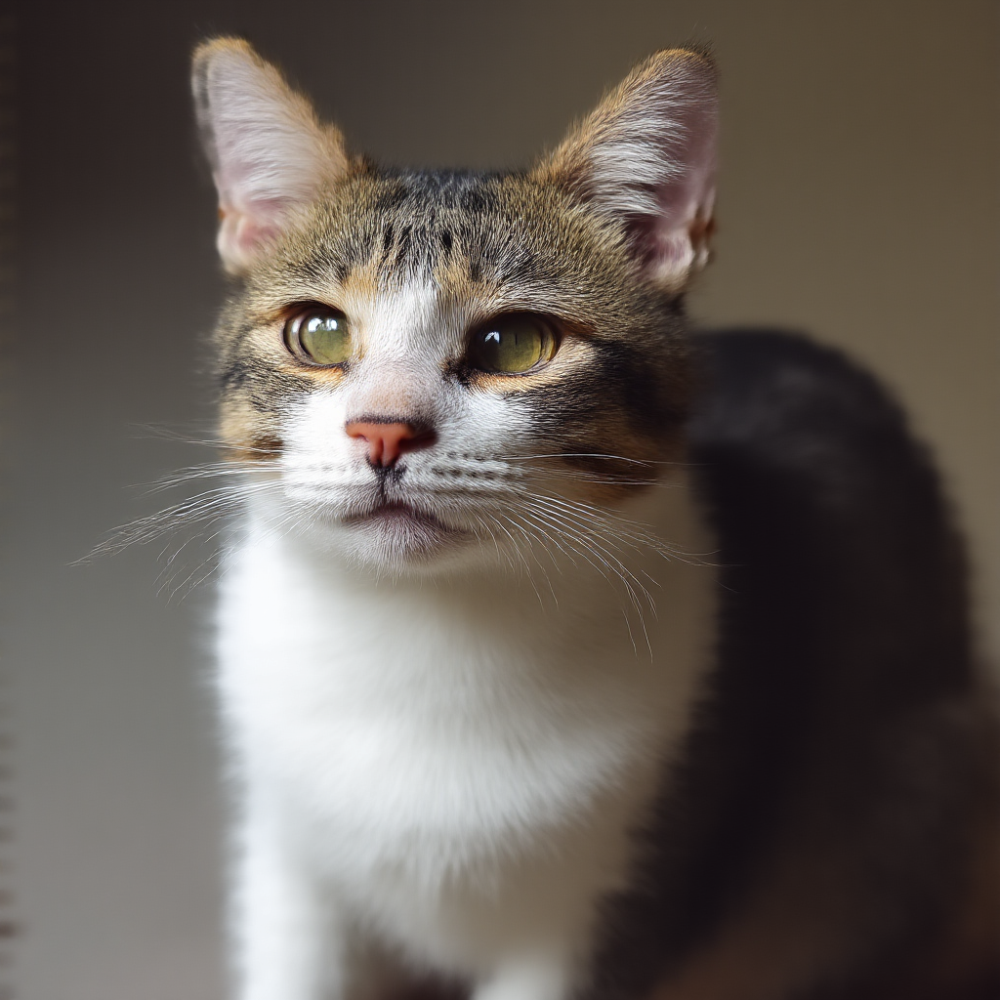

In [17]:
generator = torch.Generator(device="cuda").manual_seed(0)
prompt = "A cat"
image = pipe(
    prompt,
    height=1024,
    width=1024,
    guidance_scale=7.5,
    num_inference_steps=30,
    max_sequence_length=512, # For prompt
    generator=generator
).images[0]
image

100%|██████████| 30/30 [00:15<00:00,  1.89it/s]


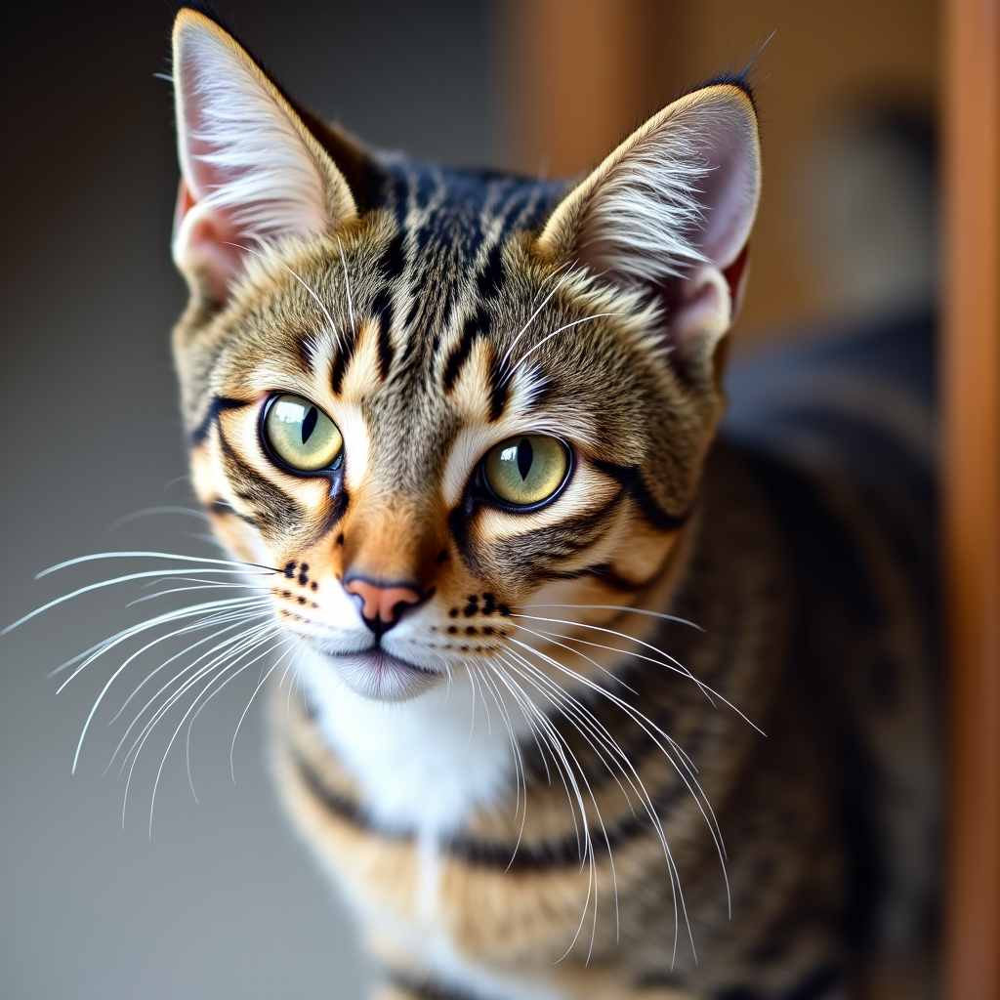

In [3]:
generator = torch.Generator(device="cuda").manual_seed(0)
prompt = "A cat"
image = pipe(
    prompt,
    height=1024,
    width=1024,
    guidance_scale=7.5,
    num_inference_steps=30,
    max_sequence_length=512, # For prompt
    generator=generator
).images[0]
image